In [1]:
import pandas as pd

## transaction


In [2]:
dateColumns = ['t_dat']
convertTable = dict()
convertTable['article_id'] = str
convertTable['sales_channel_id'] = str

ts = pd.read_csv ('transactions_train.csv', parse_dates=dateColumns, dtype = convertTable)
ts.head()

,t_dat,customer_id,article_id,price,sales_channel_id
0,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,0663713001,0.050831,2
1,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,0541518023,0.030492,2
2,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,0505221004,0.015237,2
3,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,0685687003,0.016932,2
4,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,0685687004,0.016932,2


In [3]:
ts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31788324 entries, 0 to 31788323
Data columns (total 5 columns):
 #   Column            Dtype         
---  ------            -----         
 0   t_dat             datetime64[ns]
 1   customer_id       object        
 2   article_id        object        
 3   price             float64       
 4   sales_channel_id  object        
dtypes: datetime64[ns](1), float64(1), object(3)
memory usage: 1.2+ GB


In [4]:
# Calculate the percentage of missing values 
missing_values = ts.isnull().sum()
missing_values_percentage = 100 * missing_values / len(ts)
missing_values_table = pd.concat([missing_values, missing_values_percentage], axis=1)
missing_values_table = missing_values_table.rename(columns = {0 : 'Missing Values', 1 : '% of Missing Values'})
missing_values_table = missing_values_table[missing_values_table.iloc[:,0] != 0].sort_values('% of Missing Values', ascending=False).round(1)
missing_values_table

,Missing Values,% of Missing Values


## Article

In [5]:
convertTable = dict()
convertTable['article_id'] = str
convertTable['product_code'] = str
convertTable['product_type_no'] = str
convertTable['graphical_appearance_no'] = str
convertTable['colour_group_code'] = str
convertTable['perceived_colour_value_id'] = str
convertTable['perceived_colour_master_id'] = str
convertTable['department_no'] = str
convertTable['index_group_no'] = str
convertTable['section_no'] = str
convertTable['garment_group_no'] = str
at = pd.read_csv ('articles.csv', dtype = convertTable)
at.head()

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,0108775015,0108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,09,Black,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
1,0108775044,0108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
2,0108775051,0108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
3,0110065001,0110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,09,Black,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."
4,0110065002,0110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."


In [6]:
at.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105542 entries, 0 to 105541
Data columns (total 25 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   article_id                    105542 non-null  object
 1   product_code                  105542 non-null  object
 2   prod_name                     105542 non-null  object
 3   product_type_no               105542 non-null  object
 4   product_type_name             105542 non-null  object
 5   product_group_name            105542 non-null  object
 6   graphical_appearance_no       105542 non-null  object
 7   graphical_appearance_name     105542 non-null  object
 8   colour_group_code             105542 non-null  object
 9   colour_group_name             105542 non-null  object
 10  perceived_colour_value_id     105542 non-null  object
 11  perceived_colour_value_name   105542 non-null  object
 12  perceived_colour_master_id    105542 non-null  object
 13 

In [7]:
# Calculate the percentage of missing values 
missing_values = at.isnull().sum()
missing_values_percentage = 100 * missing_values / len(at)
missing_values_table = pd.concat([missing_values, missing_values_percentage], axis=1)
missing_values_table = missing_values_table.rename(columns = {0 : 'Missing Values', 1 : '% of Missing Values'})
missing_values_table = missing_values_table[missing_values_table.iloc[:,0] != 0].sort_values('% of Missing Values', ascending=False).round(1)
missing_values_table

,Missing Values,% of Missing Values
detail_desc,416,0.4


In [8]:
print(len(at[at.isnull().any(axis=1)].index))

416


แสดงว่า 416 แถวที่หายไปก็อยู่ใน col นั้นหมดเลย อาจเลี่ยงโดยการไม่พิจารณา column detail_desc

In [9]:
print(len(set(at['prod_name'])))
print(set(at['prod_name']))

45875
{'Xmas Dot Lurex 2p socks', 'Salsa Dress', 'PARTY Greta dress', 'Cool Hall Imsi hoop', 'Lars-Inge 2-pack', 'Robin 3pk Anchor', 'ES REBECKA SWEATER', 'Flirty Tanja necklace', 'AK Emmental shorts', 'Sunset Wide trouser', 'Pax slip on BB', 'Spice Girl Tanga 3pk', 'Hampstead jumpsuit', 'Amy Peplum', 'Cole Casual Shoe', 'Attila Hike Boot SB', 'Boar Tank', 'OL SUE PQ slip-in', 'Mona PQ wedge', 'Kane top', 'Tulle skirt/Rosalie', 'Beanie Levy Knitted', 'DANTE set 3pcs', 'ILONA Inka cap', 'Ester mixed PJ', 'AMY mitten LATE', 'Hedda Dress', 'ED Carita dress', 'Sia ultralight one size brief', 'Michael pile sneaker SG', 'INGER woven blouse', '&denim Culotte HW', 'Nike fancy legging', 'Class Leona necklace', 'MORGAN set', 'Amaretto blazer', 'NEMO hood bomber jkt', 'Whooper cami', 'PE WRONG SKIRT', 'SPEED A-band plastic 3pk ears', 'Even loafer', 'Ally dress', 'Kansas jumpsuit', 'PRICE ITEM: Katya price', 'PINE Regular shirt - poplin', 'LOGG Christy Pile jkt.', 'Flirty Film earcuff pk', 'Evie b

In [10]:

print(len(set(at['product_type_name'])))
print(set(at['product_type_name']))

131
{'Pyjama set', 'Stain remover spray', 'Underwear bottom', 'Shoulder bag', 'Underdress', 'Watch', 'Giftbox', 'Night gown', 'Fine cosmetics', 'Costumes', 'Earrings', 'Wedge', 'Other shoe', 'T-shirt', 'Dungarees', 'Alice band', 'Flat shoe', 'Underwear body', 'Cap', 'Keychain', 'Headband', 'Bucket hat', 'Nipple covers', 'Wireless earphone case', 'Heeled sandals', 'Sarong', 'Felt hat', 'Swimwear bottom', 'Jacket', 'Leggings/Tights', 'Hairband', 'Zipper head', 'Beanie', 'Underwear corset', 'Sleep Bag', 'Other accessories', 'Ballerinas', 'Leg warmers', 'Washing bag', 'Bra', 'Wood balls', 'Mobile case', 'Toy', 'Hat/beanie', 'Dog Wear', 'Outdoor Waistcoat', 'Bra extender', 'Swimwear set', 'Clothing mist', 'Tie', 'Jumpsuit/Playsuit', 'Eyeglasses', 'Robe', 'Hoodie', 'Blanket', 'Shorts', 'Bikini top', 'Long John', 'Coat', 'Bracelet', 'Vest top', 'Ring', 'Tailored Waistcoat', 'Boots', 'Sleeping sack', 'Outdoor trousers', 'Heels', 'Cross-body bag', 'Cardigan', 'Pyjama jumpsuit/playsuit', 'Moccas

In [11]:
print(len(set(at['product_group_name'])))
print(set(at['product_group_name']))

19
{'Garment and Shoe care', 'Unknown', 'Swimwear', 'Accessories', 'Items', 'Stationery', 'Garment Lower body', 'Shoes', 'Underwear/nightwear', 'Socks & Tights', 'Furniture', 'Bags', 'Underwear', 'Garment Upper body', 'Garment Full body', 'Nightwear', 'Cosmetic', 'Fun', 'Interior textile'}


In [12]:
print(len(set(at['colour_group_name'])))
print(set(at['colour_group_name']))

50
{'Beige', 'Other Turquoise', 'Light Red', 'Light Orange', 'Other Blue', 'Unknown', 'Turquoise', 'Dark Red', 'Dark Beige', 'Dark Yellow', 'Black', 'Grey', 'Other Yellow', 'Dark Turquoise', 'Other Pink', 'White', 'Red', 'Dark Pink', 'Greyish Beige', 'Bronze/Copper', 'Other Green', 'Pink', 'Dark Purple', 'Off White', 'Purple', 'Light Purple', 'Greenish Khaki', 'Yellow', 'Gold', 'Other Red', 'Dark Orange', 'Light Green', 'Dark Grey', 'Other Orange', 'Silver', 'Other Purple', 'Dark Green', 'Light Turquoise', 'Yellowish Brown', 'Light Grey', 'Light Yellow', 'Light Beige', 'Light Pink', 'Other', 'Orange', 'Green', 'Transparent', 'Dark Blue', 'Blue', 'Light Blue'}


In [13]:
tsat = pd.merge(left=ts[['t_dat','article_id','sales_channel_id']],
                right = at[['article_id','product_type_name','product_group_name','colour_group_name']],
                how = 'left' ,
                left_on = 'article_id',
                right_on = 'article_id'
                )

# tsat = dfCusSales.drop(columns=['Customer ID','ID'])
tsat.head()

,t_dat,article_id,sales_channel_id,product_type_name,product_group_name,colour_group_name
0,2018-09-20,0663713001,2,Underwear body,Underwear,Black
1,2018-09-20,0541518023,2,Bra,Underwear,Light Pink
2,2018-09-20,0505221004,2,Sweater,Garment Upper body,Pink
3,2018-09-20,0685687003,2,Sweater,Garment Upper body,Pink
4,2018-09-20,0685687004,2,Sweater,Garment Upper body,Dark Green


In [14]:
tsat['year'] = tsat['t_dat'].dt.year
tsat['month'] = tsat['t_dat'].dt.month
tsat['day'] = tsat['t_dat'].dt.day

In [15]:
set(tsat['year'])

{2018, 2019, 2020}

In [16]:
tsat.head()

,t_dat,article_id,sales_channel_id,product_type_name,product_group_name,colour_group_name,year,month,day
0,2018-09-20,0663713001,2,Underwear body,Underwear,Black,2018,9,20
1,2018-09-20,0541518023,2,Bra,Underwear,Light Pink,2018,9,20
2,2018-09-20,0505221004,2,Sweater,Garment Upper body,Pink,2018,9,20
3,2018-09-20,0685687003,2,Sweater,Garment Upper body,Pink,2018,9,20
4,2018-09-20,0685687004,2,Sweater,Garment Upper body,Dark Green,2018,9,20


In [17]:
tsat.groupby(by=['year','month']).agg({'article_id': 'count'})

article_id
year month            
2018 9          594776
     10        1397040
     11        1270619
     12        1148827
2019 1         1263471
     2         1152412
     3         1286750
     4         1476454
     5         1560319
     6         1906202
     7         1807494
     8         1253530
     9         1227178
     10        1146772
     11        1198033
     12        1118315
2020 1         1076354
     2         1001859
     3         1047752
     4         1340882
     5         1361815
     6         1764507
     7         1351502
     8         1237192
     9          798269

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

<AxesSubplot:xlabel='month', ylabel='product_group_name'>

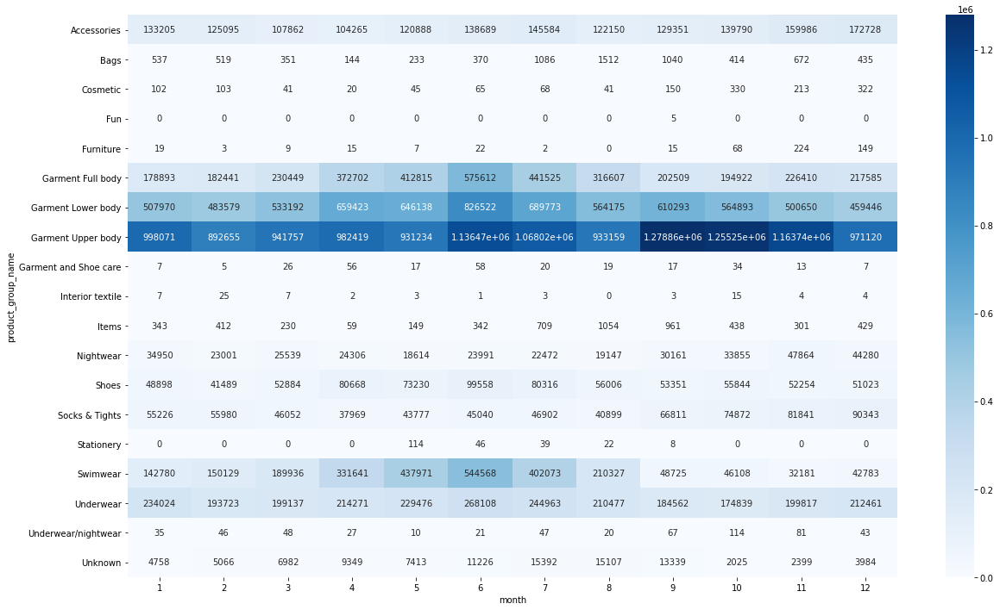

In [19]:
prog_mo = pd.pivot_table(tsat, values='article_id', index=['product_group_name'], columns=['month'], fill_value=0, aggfunc=len)

plt.figure(figsize=(20, 12))
sns.heatmap(prog_mo, annot=True, fmt='g', cmap='Blues')

<AxesSubplot:xlabel='month', ylabel='product_type_name'>

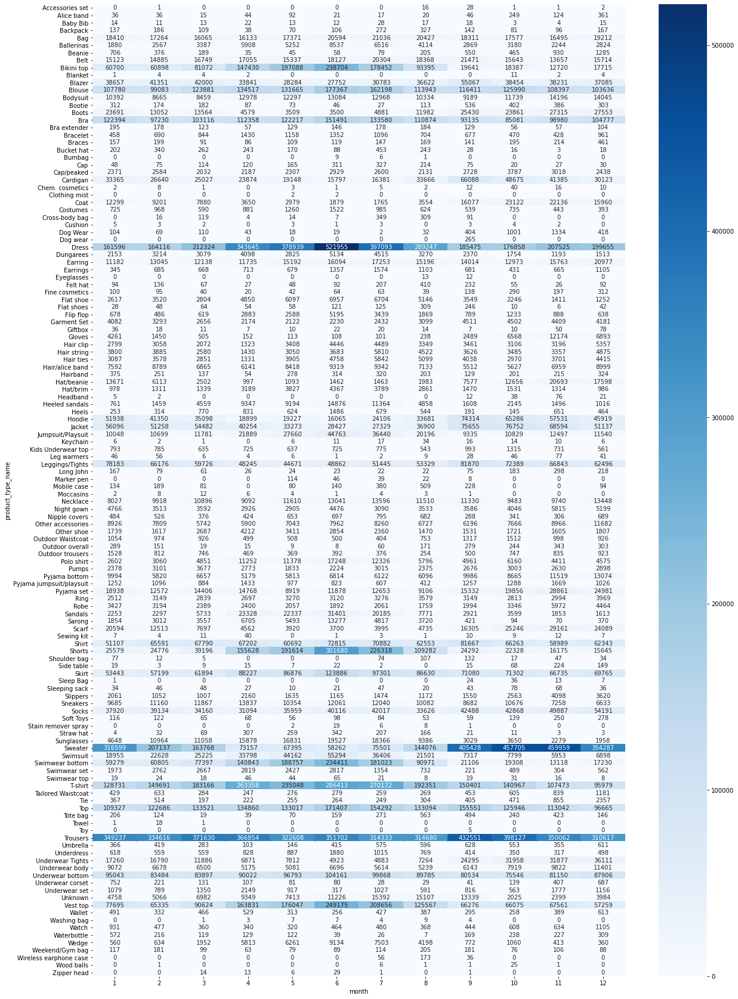

In [20]:
prot_mo = pd.pivot_table(tsat, values='article_id', index=['product_type_name'], columns=['month'], fill_value=0, aggfunc=len)

plt.figure(figsize=(20, 30))
sns.heatmap(prot_mo, annot=True, fmt='g', cmap='Blues')

In [21]:
dt_time =tsat.copy()
# dt_time_2018 = dt_time[dt_time['year']==2018]
# dt_time
prodt_ts =  dt_time.groupby(by=['t_dat','product_type_name']).agg({'article_id': 'count'})
prodt_ts
# time_ts.pivot_tale('article_id', index=['t_dat'],columns='product_type_name')

article_id
t_dat      product_type_name            
2018-09-20 Bag                       377
           Ballerinas                 82
           Belt                      244
           Bikini top                535
           Blazer                    684
...                                  ...
2020-09-22 Wallet                      2
           Watch                       5
           Waterbottle                 1
           Wedge                      10
           Weekend/Gym bag             2

[68558 rows x 1 columns]

In [22]:
prodg_ts =  dt_time.groupby(by=['t_dat','product_group_name']).agg({'article_id': 'count'})
prodg_ts

article_id
t_dat      product_group_name             
2018-09-20 Accessories                2194
           Bags                          1
           Cosmetic                      6
           Garment Full body          3600
           Garment Lower body        11868
...                                    ...
2020-09-22 Socks & Tights              752
           Swimwear                    354
           Underwear                  2466
           Underwear/nightwear           1
           Unknown                     432

[9679 rows x 1 columns]

In [23]:
import plotly.express as px
time_prot_plot = prodt_ts.copy()
time_prot_plot = time_prot_plot.reset_index()
time_prot_plot['article_id'] = time_prot_plot['article_id'].rolling(1200).mean()

fig = px.line(time_prot_plot, x="t_dat", y="article_id", color='product_type_name', width =900,height=700)
fig.show()


# Machine learning for store damand forecasting

In [24]:
!pip install xgboost

You should consider upgrading via the 'c:\users\kornc\documents\anaconda3\python.exe -m pip install --upgrade pip' command.


In [25]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error

## (I) using XGBoost

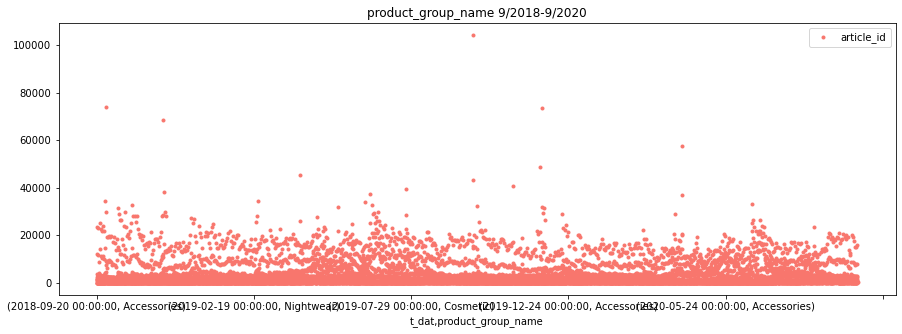

In [26]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = prodg_ts.plot(style='.', figsize=(15,5), color=color_pal[0], title='product_group_name 9/2018-9/2020')

In [27]:
prodg_ts.head()

article_id
t_dat      product_group_name            
2018-09-20 Accessories               2194
           Bags                         1
           Cosmetic                     6
           Garment Full body         3600
           Garment Lower body       11868

# Accessories

### train/test split ใช้ Feb to Sep 2020 เป็น test

In [138]:
split_date = '2020-01-31'
prog_time = prodg_ts.copy()
prog_time = prog_time.reset_index()
prog_Acc = prog_time[prog_time['product_group_name']=='Accessories']
prog_Acc = prog_Acc.set_index('t_dat')
prog_Acc = prog_Acc.drop(['product_group_name'], axis=1)
prog_Acc_train = prog_Acc.loc[prog_Acc.index <= split_date].copy()
prog_Acc_test = prog_Acc.loc[prog_Acc.index > split_date].copy()

In [139]:
prog_Acc_test.head()

,article_id
t_dat,
2020-02-01,2527
2020-02-02,1619
2020-02-03,1574
2020-02-04,1575
2020-02-05,2026


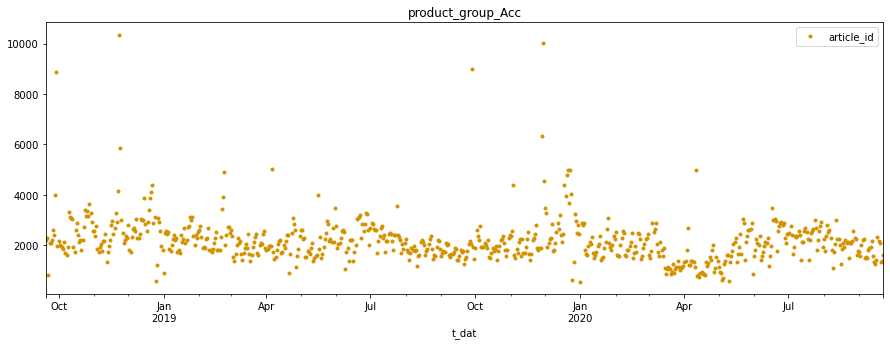

In [140]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = prog_Acc.plot(style='.', figsize=(15,5), color=color_pal[1], title='product_group_Acc')

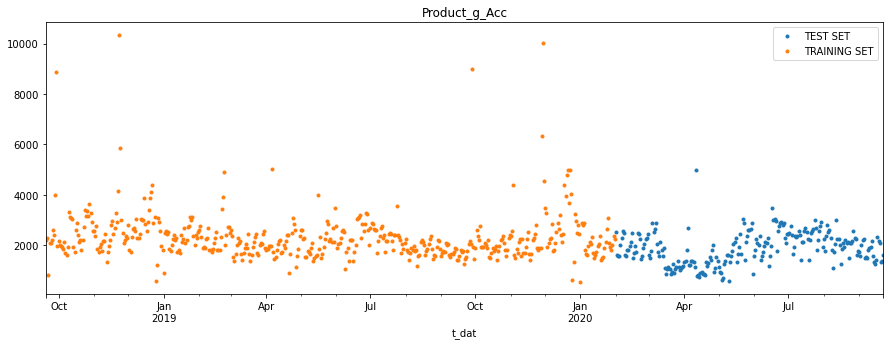

In [141]:
_ = prog_Acc_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prog_Acc_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_g_Acc', style='.')

### Create Time Series Features

In [142]:
def create_features(df, label=None):
    """
    Creates time series features from datetime index
    """
    df['date'] = df.index
#     df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [143]:
create_features(df=prog_Acc_test, label=None)

<ipython-input-142-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


In [144]:
X_train, y_train = create_features(prog_Acc_train, label='article_id')
X_test, y_test = create_features(prog_Acc_test, label='article_id')

<ipython-input-142-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



### Create XGBoost Model

In [73]:
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

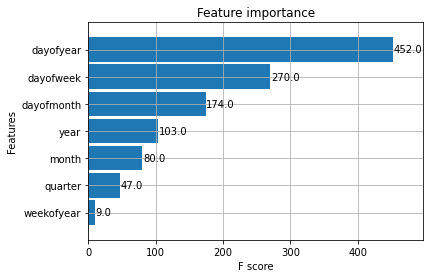

In [74]:
_ = plot_importance(reg, height=0.9)

### Forecast on Test Set

In [75]:
prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)

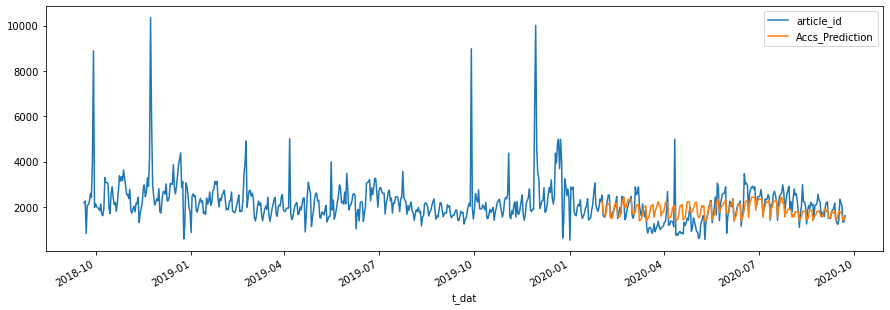

In [76]:
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

### Look at first month of predictions

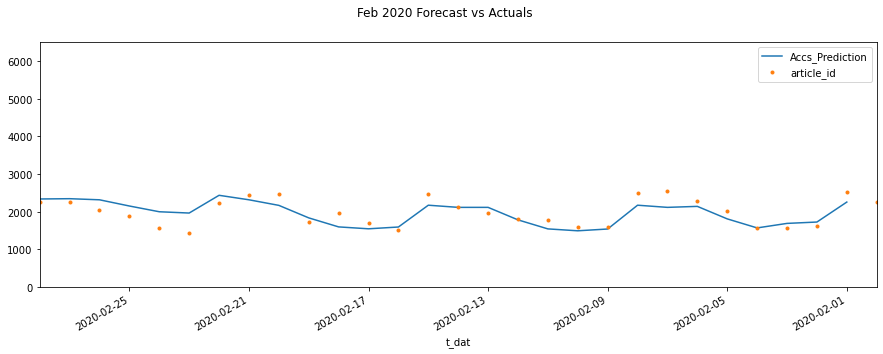

In [77]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

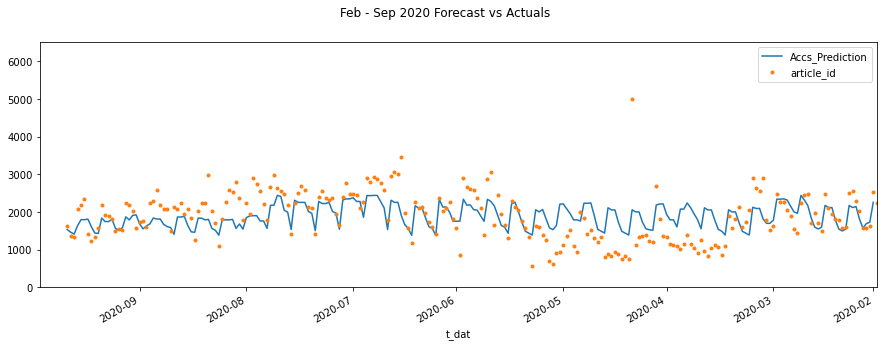

In [78]:
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

### Error Metrics On Test Set

In [79]:
mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

296269.6146234011

In [80]:
mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

411.4782200590093

In [81]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [82]:
mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

27.121733047278774

### Look at Worst and Best Predicted Days

In [83]:
prog_Acc_test['error'] = prog_Acc_test['article_id'] - prog_Acc_test['Accs_Prediction']
prog_Acc_test['abs_error'] = prog_Acc_test['error'].apply(np.abs)
error_by_day = prog_Acc_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Accs_Prediction','error','abs_error']]

In [84]:
# Over forecasted days
error_by_day.sort_values('error', ascending=True).head(10)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2020 5     2                925.0      2207.843994 -1282.843994  1282.843994
     4     18               875.0      2111.707031 -1236.707031  1236.707031
           17               842.0      2054.464355 -1212.464355  1212.464355
     3     20               843.0      2054.464355 -1211.464355  1211.464355
           21               957.0      2111.707031 -1154.707031  1154.707031
     4     16               931.0      2054.464355 -1123.464355  1123.464355
     5     1               1134.0      2213.138428 -1079.138428  1079.138428
     3     28              1008.0      2075.934082 -1067.934082  1067.934082
           19              1042.0      2054.464355 -1012.464355  1012.464355
           25              1153.0      2111.524658  -958.524658   958.524658

In [85]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2020 4     11              4989.0      2058.726074  2930.273926  2930.273926
     6     17              3471.0      1901.518921  1569.481079  1569.481079
     5     2                925.0      2207.843994 -1282.843994  1282.843994
     4     18               875.0      2111.707031 -1236.707031  1236.707031
     8     4               2797.0      1563.400024  1233.599976  1233.599976
     4     17               842.0      2054.464355 -1212.464355  1212.464355
     3     20               843.0      2054.464355 -1211.464355  1211.464355
     8     12              2989.0      1803.075317  1185.924683  1185.924683
     3     21               957.0      2111.707031 -1154.707031  1154.707031
     4     16               931.0      2054.464355 -1123.464355  1123.464355

In [86]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

article_id  Accs_Prediction      error  abs_error
year month dayofmonth                                                   
2020 2     14              2115.0      2117.378174  -2.378174   2.378174
           4               1575.0      1571.849854   3.150146   3.150146
     6     12              2102.0      2105.649170  -3.649170   3.649170
           15              1566.0      1558.398315   7.601685   7.601685
     9     9               1811.0      1803.075317   7.924683   7.924683
     2     12              1802.0      1785.342285  16.657715  16.657715
     8     8               1817.0      1791.778076  25.221924  25.221924
     6     11              2133.0      2105.649170  27.350830  27.350830
     7     6               1940.0      1968.085083 -28.085083  28.085083
     9     7               1542.0      1512.935669  29.064331  29.064331

### Plotting some best/worst predicted days

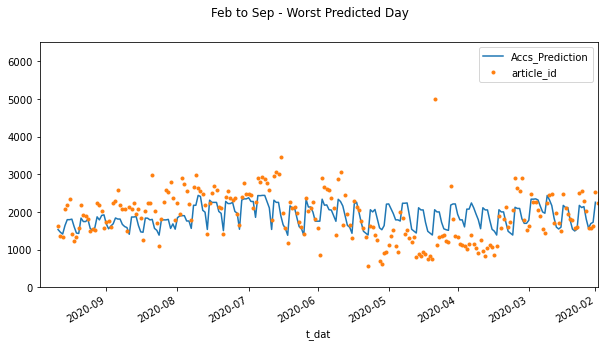

In [87]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 6500)
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
plot = plt.suptitle('Feb to Sep - Worst Predicted Day')

### ลองเปลี่ยน n_estimatior กับ learning_rate

In [271]:
# Create XGBoost Model for n_estimators= 120
reg = xgb.XGBRegressor(n_estimators=120, learning_rate=0.3)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.3, max_delta_step=0,
             max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=120, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

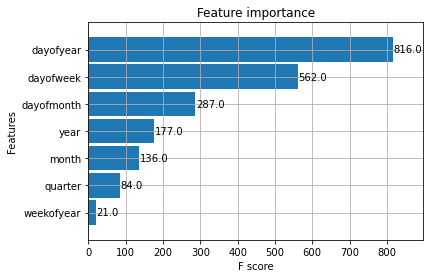

In [272]:
_ = plot_importance(reg, height=0.9)

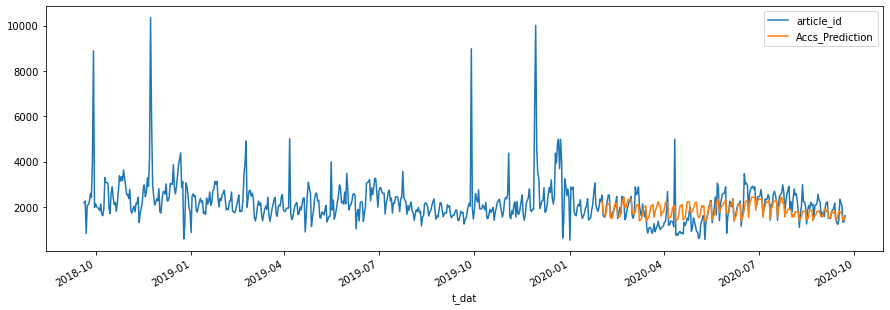

In [273]:
#Forecast on Test Set
prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

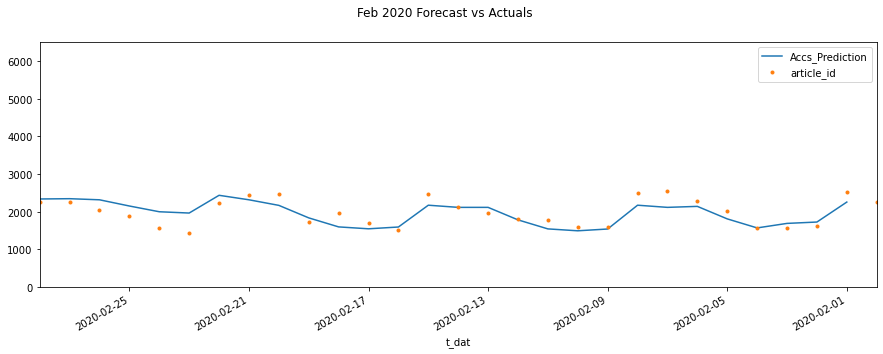

In [274]:
# 1st month
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

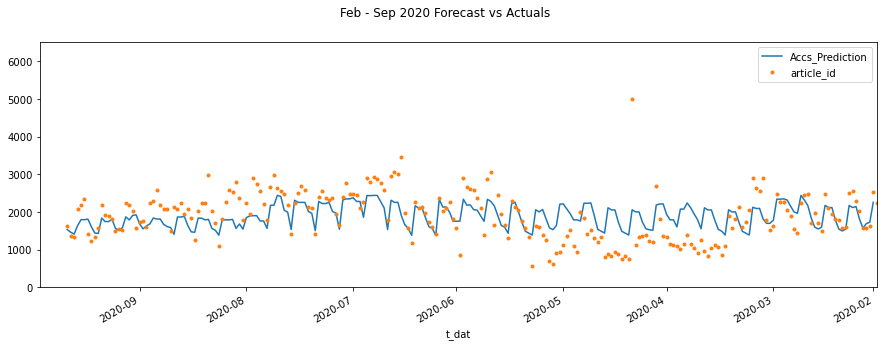

In [275]:
# 6 months
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

In [276]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [277]:
print(mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))

296269.6146234011
411.4782200590093
27.121733047278774


### ลอง train/test split ใช้ Feb to Sep 2019 เป็น test

In [50]:
split_date = '2019-01-31'
prog_time = prodg_ts.copy()
prog_time = prog_time.reset_index()
prog_Acc = prog_time[prog_time['product_group_name']=='Accessories']
prog_Acc = prog_Acc.set_index('t_dat')
prog_Acc = prog_Acc.drop(['product_group_name'], axis=1)
prog_Acc_train = prog_Acc.loc[prog_Acc.index <= split_date].copy()
prog_Acc_test = prog_Acc.loc[prog_Acc.index > split_date].copy()

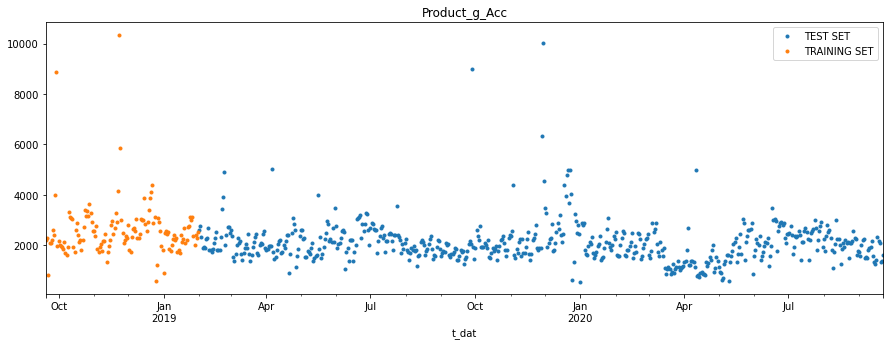

In [51]:
_ = prog_Acc_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prog_Acc_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_g_Acc', style='.')

In [52]:
create_features(df=prog_Acc_test, label=None)

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2019-02-01,4,1,2,2019,32,1,5
2019-02-02,5,1,2,2019,33,2,5
2019-02-03,6,1,2,2019,34,3,5
2019-02-04,0,1,2,2019,35,4,6
2019-02-05,1,1,2,2019,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


In [53]:
X_train, y_train = create_features(prog_Acc_train, label='article_id')
X_test, y_test = create_features(prog_Acc_test, label='article_id')

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



In [54]:
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

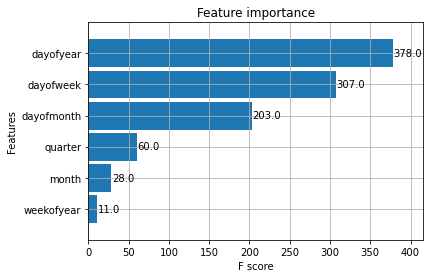

In [55]:
_ = plot_importance(reg, height=0.9)

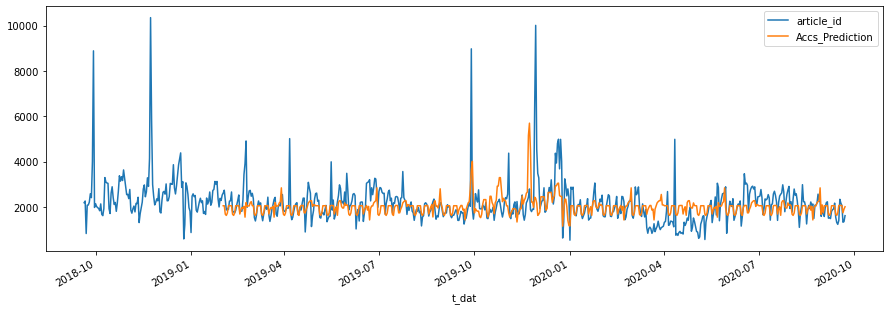

In [56]:
# Forcast on test set

prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

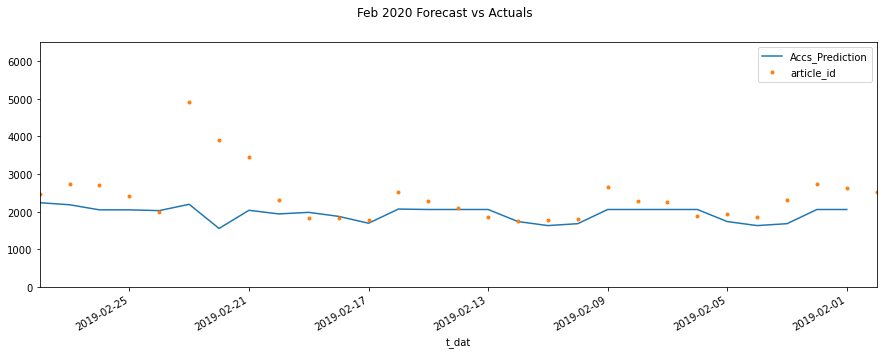

In [57]:
# look at Feb 2019
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2019', upper='28-02-2019')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

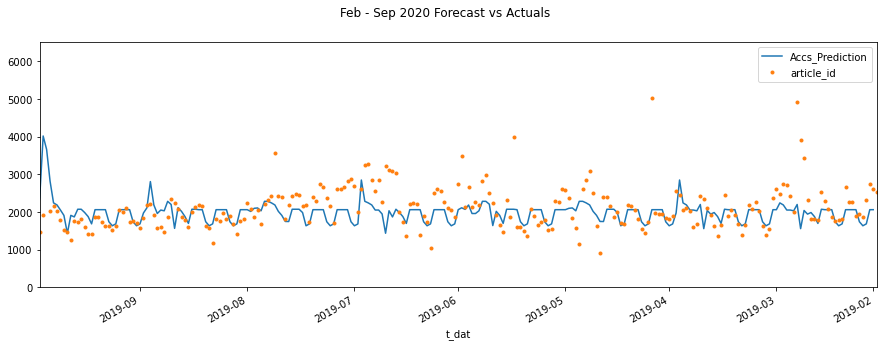

In [58]:
# look at Feb to Sep 2019
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2019', upper='30-09-2019')
ax.set_ylim(0, 6500)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

### Error Metrics On Test Set

In [59]:
mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

578568.3988798556

In [60]:
mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

467.65381815592445

In [61]:
mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction'])

23.91739973392159

### Look at Worst and Best Predicted Days

In [62]:
prog_Acc_test['error'] = prog_Acc_test['article_id'] - prog_Acc_test['Accs_Prediction']
prog_Acc_test['abs_error'] = prog_Acc_test['error'].apply(np.abs)
error_by_day = prog_Acc_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Accs_Prediction','error','abs_error']]
# Over forecasted days

#best predict
error_by_day.sort_values('error', ascending=True)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2019 11    23              2800.0      5700.733398 -2900.733398  2900.733398
           22              2438.0      5156.969727 -2718.969727  2718.969727
           24              1888.0      4477.887207 -2589.887207  2589.887207
     9     29              1918.0      4017.720215 -2099.720215  2099.720215
2020 3     29              1094.0      2557.962891 -1463.962891  1463.962891
...                           ...              ...          ...          ...
     4     11              4989.0      2060.778076  2928.221924  2928.221924
2019 4     6               5019.0      2060.778076  2958.221924  2958.221924
     11    28              6331.0      2437.528809  3893.471191  3893.471191
     9     28              8977.0      3659.854736  5317.145264  5317.145264
     11    29             10011.0      2382.878906  7628.121094  7628.121094

[600 rows x 4 columns]

In [63]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

article_id  Accs_Prediction        error    abs_error
year month dayofmonth                                                       
2019 11    29             10011.0      2382.878906  7628.121094  7628.121094
     9     28              8977.0      3659.854736  5317.145264  5317.145264
     11    28              6331.0      2437.528809  3893.471191  3893.471191
     4     6               5019.0      2060.778076  2958.221924  2958.221924
2020 4     11              4989.0      2060.778076  2928.221924  2928.221924
2019 11    23              2800.0      5700.733398 -2900.733398  2900.733398
           22              2438.0      5156.969727 -2718.969727  2718.969727
     2     23              4916.0      2198.740967  2717.259033  2717.259033
     11    3               4378.0      1739.783081  2638.216919  2638.216919
           24              1888.0      4477.887207 -2589.887207  2589.887207

In [64]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

article_id  Accs_Prediction      error  abs_error
year month dayofmonth                                                   
2020 6     9               1742.0      1740.384399   1.615601   1.615601
2019 12    13              2651.0      2647.876709   3.123291   3.123291
2020 9     1               1737.0      1740.384399  -3.384399   3.384399
           19              2069.0      2072.433594  -3.433594   3.433594
     2     18              1980.0      1984.977173  -4.977173   4.977173
     8     26              2180.0      2186.466797  -6.466797   6.466797
2019 2     12              1748.0      1740.384399   7.615601   7.615601
2020 6     29              2098.0      2107.120605  -9.120605   9.120605
2019 4     14              1675.0      1684.290283  -9.290283   9.290283
     7     7               1695.0      1684.290283  10.709717  10.709717

### Plotting some best/worst predicted days

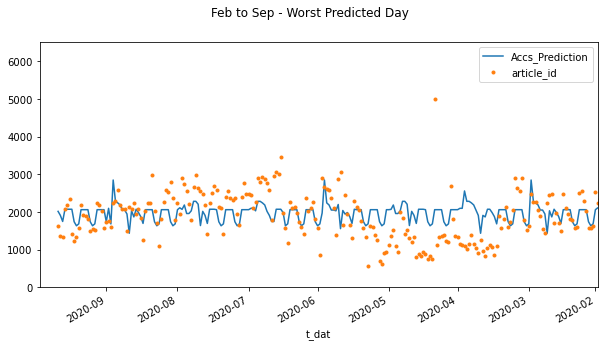

In [65]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 6500)
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
plot = plt.suptitle('Feb to Sep - Worst Predicted Day')

# Bags

### Bags train/test split ใช้ Feb to Sep 2020 เป็น test

In [74]:
split_date = '2020-01-31'
prog_time = prodg_ts.copy()
prog_time = prog_time.reset_index()
prog_Acc = prog_time[prog_time['product_group_name']=='Bags']
prog_Acc = prog_Acc.set_index('t_dat')
prog_Acc = prog_Acc.drop(['product_group_name'], axis=1)
prog_Acc_train = prog_Acc.loc[prog_Acc.index <= split_date].copy()
prog_Acc_test = prog_Acc.loc[prog_Acc.index > split_date].copy()
prog_Acc_test.head()

,article_id
t_dat,
2020-02-01,11
2020-02-02,17
2020-02-03,15
2020-02-04,22
2020-02-05,17


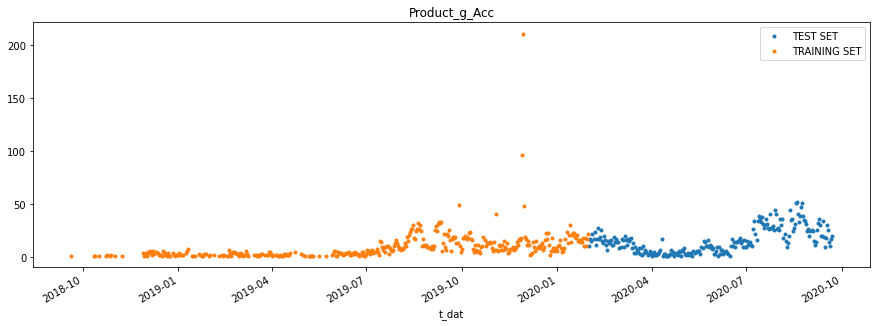

In [75]:
_ = prog_Acc_test \
    .rename(columns={'article_id': 'TEST SET'}) \
    .join(prog_Acc_train.rename(columns={'article_id': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Product_g_Acc', style='.')

### Create Time Series Features

In [76]:
create_features(df=prog_Acc_test, label=None)

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear
t_dat,,,,,,,
2020-02-01,5,1,2,2020,32,1,5
2020-02-02,6,1,2,2020,33,2,5
2020-02-03,0,1,2,2020,34,3,6
2020-02-04,1,1,2,2020,35,4,6
2020-02-05,2,1,2,2020,36,5,6
...,...,...,...,...,...,...,...
2020-09-18,4,3,9,2020,262,18,38
2020-09-19,5,3,9,2020,263,19,38
2020-09-20,6,3,9,2020,264,20,38


In [77]:
X_train, y_train = create_features(prog_Acc_train, label='article_id')
X_test, y_test = create_features(prog_Acc_test, label='article_id')

<ipython-input-32-712428493ba5>:13: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



### Create XGBoost Model

In [79]:
reg = xgb.XGBRegressor(n_estimators=30)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False) # Change verbose to True if you want to see it train


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=30, n_jobs=16,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

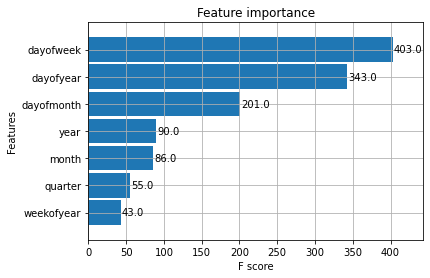

In [80]:
_ = plot_importance(reg, height=0.9)

### Forecast on Test Set

In [81]:
prog_Acc_test['Accs_Prediction'] = reg.predict(X_test)
progAcc_all = pd.concat([prog_Acc_test, prog_Acc_train], sort=False)

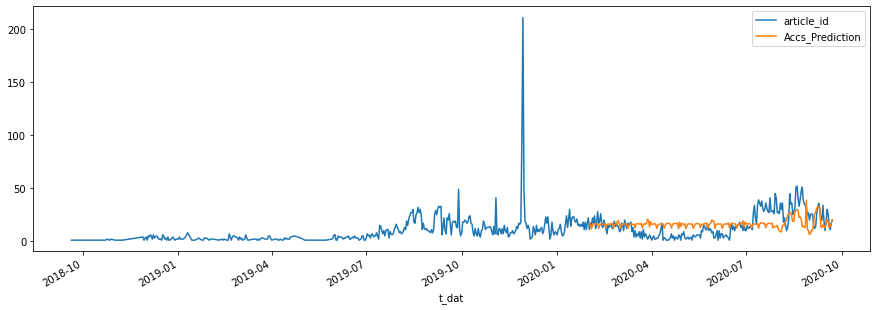

In [82]:
_ = progAcc_all[['article_id','Accs_Prediction']].plot(figsize=(15, 5))

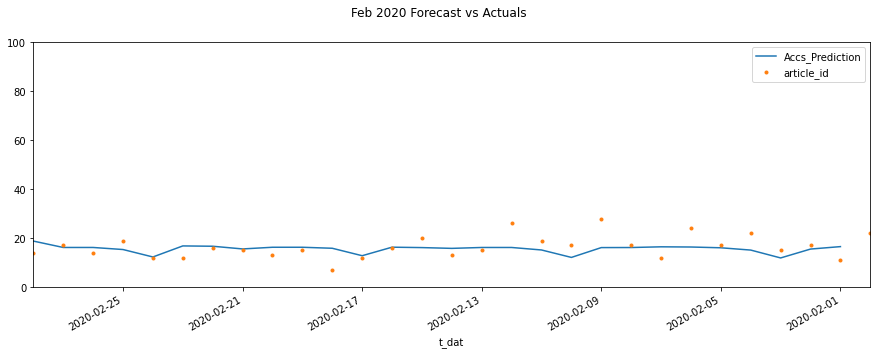

In [85]:
# 1st month prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='28-02-2020')
ax.set_ylim(0, 100)
plot = plt.suptitle('Feb 2020 Forecast vs Actuals')

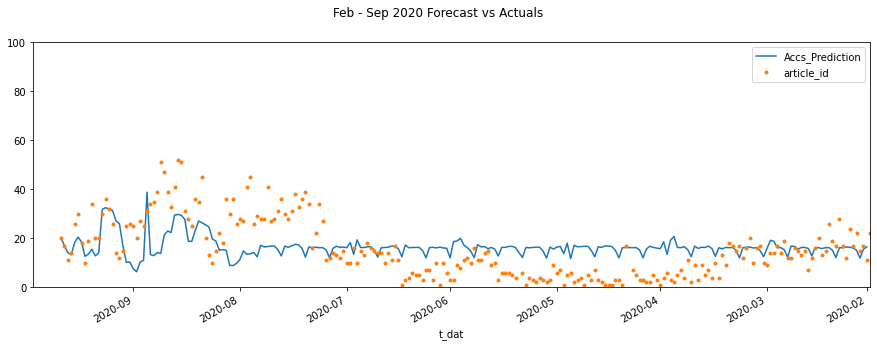

In [87]:
# 6 months prediction
# Plot the forecast with the actuals
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
ax.set_ylim(0, 100)
plot = plt.suptitle('Feb - Sep 2020 Forecast vs Actuals')

### Error Metrics On Test Set

In [90]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [91]:
print(mean_squared_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))
print(mean_absolute_percentage_error(y_true=prog_Acc_test['article_id'],
                   y_pred=prog_Acc_test['Accs_Prediction']))

131.672093311694
9.346564464814673
178.08334308103804


### Look at Worst and Best Predicted Days

In [93]:
prog_Acc_test['error'] = prog_Acc_test['article_id'] - prog_Acc_test['Accs_Prediction']
prog_Acc_test['abs_error'] = prog_Acc_test['error'].apply(np.abs)
error_by_day = prog_Acc_test.groupby(['year','month','dayofmonth']) \
    .mean()[['article_id','Accs_Prediction','error','abs_error']]

In [94]:
# Worst absolute predicted days
error_by_day.sort_values('abs_error', ascending=False).head(10)

article_id  Accs_Prediction      error  abs_error
year month dayofmonth                                                   
2020 8     24                51.0        13.808781  37.191219  37.191219
     7     29                45.0        13.689647  31.310353  31.310353
           30                41.0        13.474086  27.525914  27.525914
     8     3                 36.0         8.891671  27.108329  27.108329
     7     13                39.0        12.330522  26.669478  26.669478
     8     23                47.0        21.352831  25.647169  25.647169
           25                39.0        14.251382  24.748618  24.748618
     7     24                41.0        16.626968  24.373032  24.373032
           20                36.0        12.812213  23.187787  23.187787
     8     19                52.0        29.790798  22.209202  22.209202

In [95]:
# Best predicted days
error_by_day.sort_values('abs_error', ascending=True).head(10)

article_id  Accs_Prediction     error  abs_error
year month dayofmonth                                                  
2020 7     6                 12.0        12.036572 -0.036572   0.036572
     9     8                 32.0        31.944414  0.055586   0.055586
           21                17.0        17.067337 -0.067337   0.067337
     6     23                15.0        15.123029 -0.123029   0.123029
           17                17.0        16.834688  0.165312   0.165312
     3     10                15.0        15.170894 -0.170894   0.170894
           4                 16.0        16.218784 -0.218784   0.218784
     7     11                16.0        16.263624 -0.263624   0.263624
     2     16                16.0        16.308313 -0.308313   0.308313
           24                12.0        12.308668 -0.308668   0.308668

### Plotting some best/worst predicted days

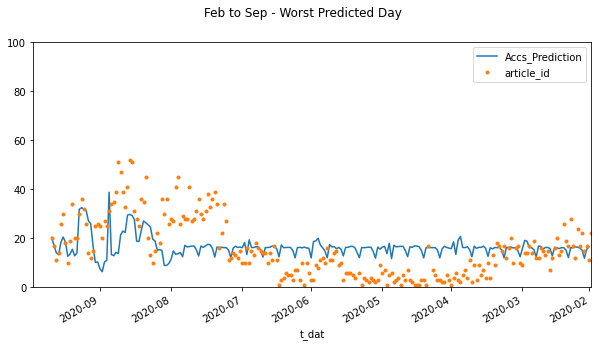

In [97]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(10)
_ = progAcc_all[['Accs_Prediction','article_id']].plot(ax=ax,
                                              style=['-','.'])
ax.set_ylim(0, 100)
ax.set_xbound(lower='31-01-2020', upper='30-09-2020')
plot = plt.suptitle('Feb to Sep - Worst Predicted Day')